In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import yfinance as yf
from sklearn.metrics import silhouette_score
import xgboost as xgb
import optuna
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from itertools import chain, combinations
from statsmodels.stats.outliers_influence import variance_inflation_factor
import plotly.graph_objects as go
import plotly.express as px

In [2]:
pd.set_option('display.max_columns', None)  # None means all columns will be shown
pd.set_option('display.max_rows', None)     # Be cautious with this if you have a lot of rows

In [3]:
df = pd.read_csv("BankChurners.csv")
df = df.drop(['CLIENTNUM','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], axis=1)

AF_mapping = {'Existing Customer': 0,'Attrited Customer': 1}
df['Attrition_Flag'] = df['Attrition_Flag'].replace(AF_mapping)

In [4]:
#1. 거래 당 지불 금액
df['Avg_Trans_Amt'] = df['Total_Trans_Amt']/df['Total_Trans_Ct']

#2. 거래 기간 대비 총 거래 횟수
df['Transaction_Frequency'] = df['Total_Trans_Ct']/df['Months_on_book']

#3. 소득 대비 총 지불 금액
income_map = {
    'Less than $40K': 20000,
    'Unknown': 60000, # Assuming average for unknowns
    '$40K - $60K': 50000,
    '$60K - $80K': 70000,
    '$80K - $120K': 100000,
    '$120K +': 160000
}

df['Approx_Income'] = df['Income_Category'].map(income_map)
df['Spending_Rate'] = df['Total_Trans_Amt'] / df['Approx_Income']

df = df.drop(['Approx_Income'], axis = 1)

#4. 활동성 지수: 은행과의 상호작용 정도를 나타냄
df['Activity_Index'] = (df['Total_Relationship_Count'] / df['Total_Relationship_Count'].max()  # 총 관계 수를 최대 관계 수로 나눈 비율
                        + (1 - df['Months_Inactive_12_mon'] / 12)  # 최근 12개월 동안 활동한 개월 수의 비율
                        + df['Contacts_Count_12_mon'] / df['Contacts_Count_12_mon'].max()  # 연락 횟수를 최대 연락 가능 횟수로 나눈 비율
                        + df['Total_Trans_Ct'] / df['Total_Trans_Ct'].max()) # 총 거래 횟수를 최대 거래 횟수로 나눈 비율

#5. 평균 계좌 유지 기간 대비 활동 지수
df['Engagement_Ratio'] = df['Activity_Index'] / df['Months_on_book']

#6. 평균 지출 당 연체 비율
df['Avg_Trans_Revolving_Ratio'] = df['Total_Revolving_Bal'] / df['Total_Trans_Amt']

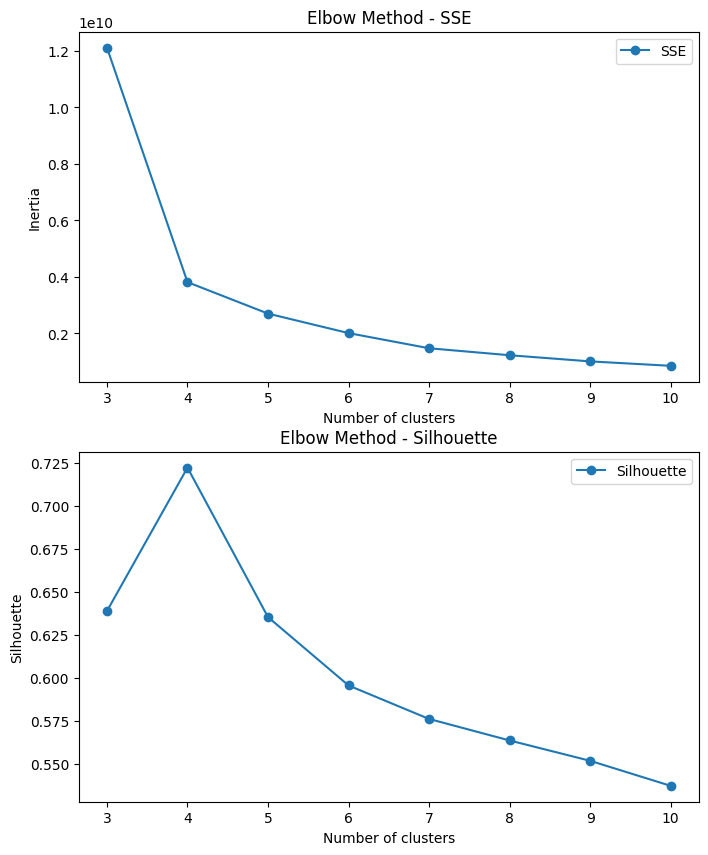

C:\Users\regan\miniconda3\envs\deep\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\regan\miniconda3\envs\deep\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


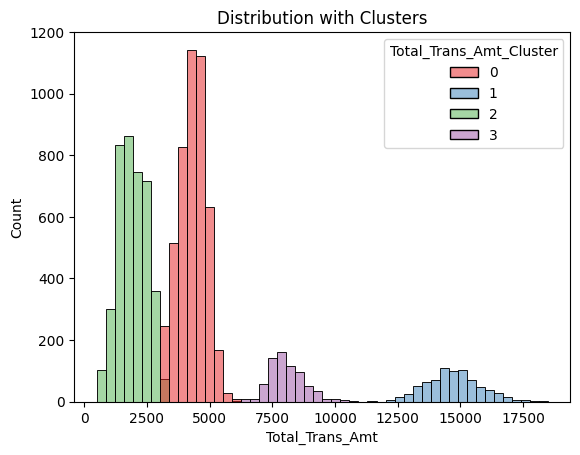

In [5]:
subdf = df.copy()
subdf = subdf[['Total_Trans_Amt']]

inertia, silhouette = [], []
K_range = range(3, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
    kmeans.fit(subdf)
    inertia.append(kmeans.inertia_)
    y_kmeans_silhouette = kmeans.predict(subdf)
    silhouette.append(silhouette_score(subdf, y_kmeans_silhouette))
    
    
plt.figure(figsize=(8,10))
plt.subplot(2,1,1)
plt.plot(K_range, inertia, label='SSE', marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method - SSE")
plt.legend()

plt.subplot(2,1,2)
plt.plot(K_range, silhouette, label='Silhouette', marker= 'o')
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette")
plt.title("Elbow Method - Silhouette")
plt.legend()
plt.show()
kmeans = KMeans(n_clusters=4, random_state=42)
df['Total_Trans_Amt_Cluster'] = kmeans.fit_predict(df[['Total_Trans_Amt']])


df['Total_Trans_Amt_Cluster'] = kmeans.fit_predict(df[['Total_Trans_Amt']])
sns.histplot(data=df, x='Total_Trans_Amt', hue='Total_Trans_Amt_Cluster', bins=50, palette='Set1')
plt.xlabel("Total_Trans_Amt")
plt.ylabel("Count")
plt.title("Distribution with Clusters")
plt.show()

In [6]:
num_cols = df.select_dtypes(include=[np.number]).columns
cat_cols = df.select_dtypes(include='object').columns

# 모든 수치형 데이터를 포함한 군집화

In [7]:
scaled_df= np.log1p(df[num_cols])
scaler = StandardScaler()
scaled_df = scaler.fit_transform(scaled_df)
scaled_df = pd.DataFrame(scaled_df, columns=num_cols)

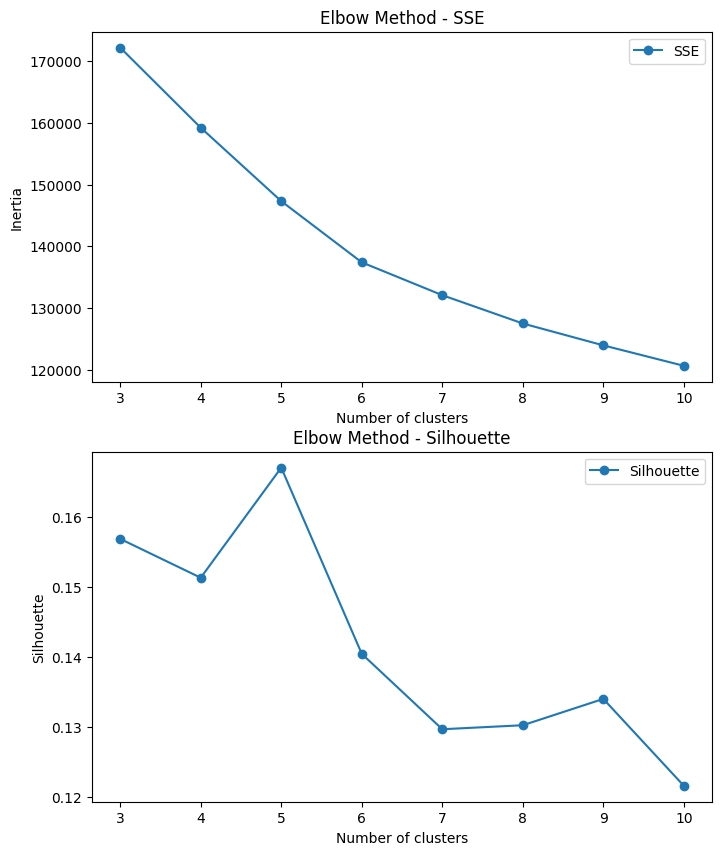

In [8]:
inertia, silhouette = [], []
K_range = range(3, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
    kmeans.fit(scaled_df)
    inertia.append(kmeans.inertia_)
    y_kmeans_silhouette = kmeans.predict(scaled_df)
    silhouette.append(silhouette_score(scaled_df, y_kmeans_silhouette))
    
    
plt.figure(figsize=(8,10))
plt.subplot(2,1,1)
plt.plot(K_range, inertia, label='SSE', marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method - SSE")
plt.legend()

plt.subplot(2,1,2)
plt.plot(K_range, silhouette, label='Silhouette', marker= 'o')
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette")
plt.title("Elbow Method - Silhouette")
plt.legend()
plt.show()

In [9]:
max_shil = max(silhouette)
best_depth = K_range[silhouette.index(max_shil)]
print(f"최대 실루엣 계수 클러스터는 {best_depth} 개")

최대 실루엣 계수 클러스터는 5 개


In [10]:
kmeans = KMeans(n_clusters=5, init='k-means++', n_init= 10, random_state=42)
kmeans.fit(scaled_df)

KMeans(n_clusters=5, n_init=10, random_state=42)

In [11]:
y_pred = kmeans.predict(scaled_df)
silhouette_avg = silhouette_score(scaled_df, y_pred)
scaled_df['Cluster'] = kmeans.labels_
print("SSE Value : {:.2f}".format(kmeans.inertia_))
print("Sihouette Score: {:.2f}".format(silhouette_avg))

SSE Value : 147307.21
Sihouette Score: 0.17


In [12]:
clustered_df = pd.concat([scaled_df['Cluster'], df[num_cols]], axis=1)
clustered_df.head()

,Cluster,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Avg_Trans_Amt,Transaction_Frequency,Spending_Rate,Activity_Index,Engagement_Ratio,Avg_Trans_Revolving_Ratio,Total_Trans_Amt_Cluster
0,2,0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,27.238095,1.076923,0.016343,2.552158,0.065440,0.679196,2
1,2,0,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,39.121212,0.750000,0.064550,2.487410,0.056532,0.669249,2
2,2,0,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,94.350000,0.555556,0.018870,1.727218,0.047978,0.000000,2
3,2,0,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,58.550000,0.588235,0.058550,1.477218,0.043448,2.149445,2
4,3,0,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,29.142857,1.333333,0.011657,1.951439,0.092926,0.000000,2


In [13]:
cluster_means = clustered_df.groupby('Cluster').mean().transpose()
cluster_means

Cluster,0,1,2,3,4
Attrition_Flag,0.139385,0.007062,0.136386,0.061412,0.800609
Customer_Age,45.893495,47.872411,48.795663,34.845096,47.419330
Dependent_count,2.429593,2.508004,2.245301,1.756187,2.383562
Months_on_book,35.755540,37.590631,38.507470,23.092576,37.323440
Total_Relationship_Count,2.208006,4.031073,4.277108,4.552704,3.466514
Months_Inactive_12_mon,2.263045,2.333098,2.329639,2.098992,2.669711
Contacts_Count_12_mon,2.243746,2.274247,2.517590,2.776352,2.901065
Credit_Limit,14807.382416,6893.894350,9302.731325,6906.321815,8049.497184
Total_Revolving_Bal,1326.333095,1142.262241,1683.204819,1215.293309,189.812024
Avg_Open_To_Buy,13481.049321,5751.632109,7619.526506,5691.028506,7859.685160


In [14]:
cluster_description = clustered_df.groupby('Cluster').describe(include='all').transpose()
cluster_description.head()

Cluster                         0            1            2            3  \
Attrition_Flag count  1399.000000  4248.000000  2075.000000  1091.000000   
               mean      0.139385     0.007062     0.136386     0.061412   
               std       0.346472     0.083749     0.343280     0.240194   
               min       0.000000     0.000000     0.000000     0.000000   
               25%       0.000000     0.000000     0.000000     0.000000   

Cluster                         4  
Attrition_Flag count  1314.000000  
               mean      0.800609  
               std       0.399695  
               min       0.000000  
               25%       1.000000

# 명확한 구분이 있던 파생변수의 따른 군집화

In [15]:
scaled_df= np.log1p(df[num_cols])
scaler = StandardScaler()
scaled_df = scaler.fit_transform(scaled_df)
scaled_df = pd.DataFrame(scaled_df, columns=num_cols)
selected_cols = ['Attrition_Flag', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Activity_Index', 'Avg_Trans_Revolving_Ratio']
scaled_df = scaled_df[selected_cols]

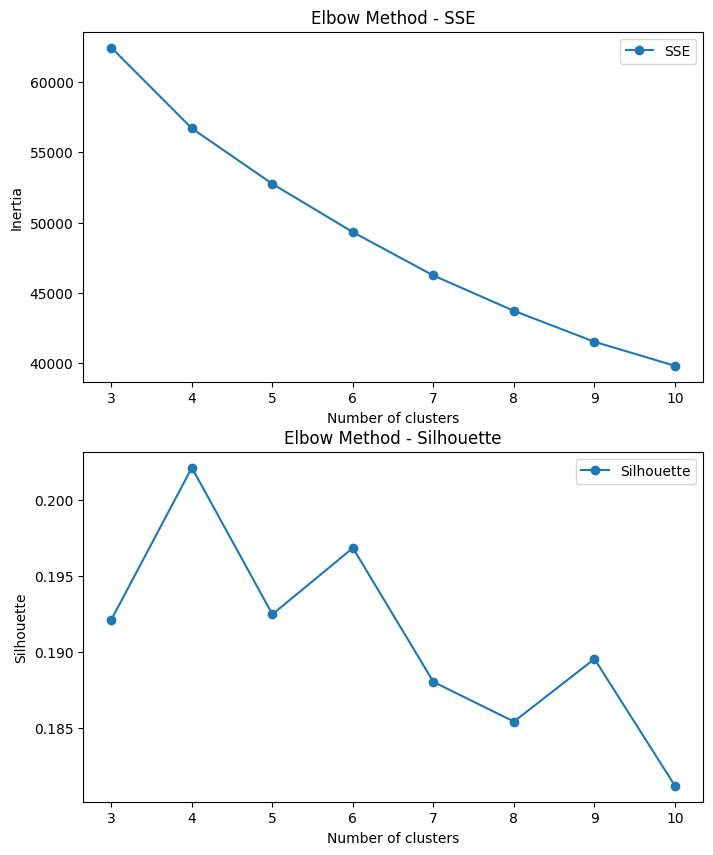

최대 실루엣 계수 클러스터는 4 개


In [16]:
inertia, silhouette = [], []
K_range = range(3, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=0)
    kmeans.fit(scaled_df)
    inertia.append(kmeans.inertia_)
    y_kmeans_silhouette = kmeans.predict(scaled_df)
    silhouette.append(silhouette_score(scaled_df, y_kmeans_silhouette))
    
    
plt.figure(figsize=(8,10))
plt.subplot(2,1,1)
plt.plot(K_range, inertia, label='SSE', marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method - SSE")
plt.legend()

plt.subplot(2,1,2)
plt.plot(K_range, silhouette, label='Silhouette', marker= 'o')
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette")
plt.title("Elbow Method - Silhouette")
plt.legend()
plt.show()

max_shil = max(silhouette)
best_depth = K_range[silhouette.index(max_shil)]
print(f"최대 실루엣 계수 클러스터는 {best_depth} 개")



In [17]:
kmeans = KMeans(n_clusters=6, init='k-means++', n_init= 10, random_state=42)
kmeans.fit(scaled_df)
y_pred = kmeans.predict(scaled_df)
silhouette_avg = silhouette_score(scaled_df, y_pred)

print("SSE Value : {:.2f}".format(kmeans.inertia_))
print("Sihouette Score: {:.2f}".format(silhouette_avg))

SSE Value : 49314.56
Sihouette Score: 0.20


In [18]:
scaled_df['Cluster'] = kmeans.labels_
clustered_df = pd.concat([scaled_df['Cluster'], df[num_cols]], axis=1)
Cluster_mapping = {0: 'VIP 고객', 1: '제로 리스크 고객', 2 : '일반 고객', 3: '고위험 고객', 4: '이탈 고객', 5: '잠재적 고객'}
clustered_df['Cluster'] = clustered_df['Cluster'].replace(Cluster_mapping)
clustered_df.head()

,Cluster,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Avg_Trans_Amt,Transaction_Frequency,Spending_Rate,Activity_Index,Engagement_Ratio,Avg_Trans_Revolving_Ratio,Total_Trans_Amt_Cluster
0,일반 고객,0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,27.238095,1.076923,0.016343,2.552158,0.065440,0.679196,2
1,일반 고객,0,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,39.121212,0.750000,0.064550,2.487410,0.056532,0.669249,2
2,제로 리스크 고객,0,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,94.350000,0.555556,0.018870,1.727218,0.047978,0.000000,2
3,고위험 고객,0,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,58.550000,0.588235,0.058550,1.477218,0.043448,2.149445,2
4,제로 리스크 고객,0,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,29.142857,1.333333,0.011657,1.951439,0.092926,0.000000,2


In [19]:
cluster_means = clustered_df.groupby('Cluster').mean().transpose()
ordered_columns = ['VIP 고객', '제로 리스크 고객', '일반 고객', '고위험 고객', '이탈 고객', '잠재적 고객']
cluster_means = cluster_means.reindex(columns=ordered_columns)

cluster_means

Cluster,VIP 고객,제로 리스크 고객,일반 고객,고위험 고객,이탈 고객,잠재적 고객
Attrition_Flag,0.001195,0.000000,0.004347,0.000539,1.000000,1.000000
Customer_Age,46.302867,45.913580,45.968415,47.018878,46.974803,46.542094
Dependent_count,2.484468,2.313840,2.288322,2.303128,2.390551,2.417864
Months_on_book,35.950418,35.732943,35.575196,36.447141,36.548031,36.059548
Total_Relationship_Count,1.860215,4.064977,4.740365,4.118662,3.223622,3.283368
Months_Inactive_12_mon,2.178017,2.279402,2.076789,2.717907,2.757480,2.667351
Contacts_Count_12_mon,1.987455,2.371670,2.986381,1.516721,2.875591,3.022587
Credit_Limit,11219.052151,8257.643405,8498.998928,7316.220119,7735.148189,8337.219815
Total_Revolving_Bal,1445.099164,0.000000,1501.490003,1675.930960,1635.514961,30.135524
Avg_Open_To_Buy,9773.952987,8257.643405,6997.508925,5640.289159,6099.633228,8307.084292


In [20]:
cluster_description = clustered_df.groupby('Cluster').describe(include='all').transpose()
cluster_description

Cluster                                VIP 고객        고위험 고객         이탈 고객  \
Attrition_Flag            count   1674.000000   1854.000000    635.000000   
                          mean       0.001195      0.000539      1.000000   
                          std        0.034555      0.023224      0.000000   
                          min        0.000000      0.000000      1.000000   
                          25%        0.000000      0.000000      1.000000   
                          50%        0.000000      0.000000      1.000000   
                          75%        0.000000      0.000000      1.000000   
                          max        1.000000      1.000000      1.000000   
Customer_Age              count   1674.000000   1854.000000    635.000000   
                          mean      46.302867     47.018878     46.974803   
                          std        7.048184      8.349436      7.517760   
                          min       26.000000     26.000000     26.000000   
                          25%       42.000000     41.000000     42.000000   
                          50%       46.000000     47.000000     47.000000   
                          75%       51.000000     53.000000     52.000000   
                          max       65.000000     73.000000     68.000000   
Dependent_count           count   1674.000000   1854.000000    635.000000   
                          mean       2.484468      2.303128      2.390551   
                          std        1.280713      1.326724      1.232539   
                          min        0.000000      0.000000      0.000000   
                          25%        2.000000      1.000000      2.000000   
                          50%        2.000000      2.000000      2.000000   
                          75%        3.000000      3.000000      3.000000   
                          max        5.000000      5.000000      5.000000   
Months_on_book            count   1674.000000   1854.000000    635.000000   
                          mean      35.950418     36.447141     36.548031   
                          std        7.144269      8.183748      7.668742   
                          min       13.000000     13.000000     13.000000   
                          25%       32.000000     32.000000     33.000000   
                          50%       36.000000     36.000000     36.000000   
                          75%       40.000000     41.000000     40.500000   
                          max       56.000000     56.000000     56.000000   
Total_Relationship_Count  count   1674.000000   1854.000000    635.000000   
                          mean       1.860215      4.118662      3.223622   
                          std        0.780550      1.096994      1.586738   
                          min        1.000000      2.000000      1.000000   
                          25%        1.000000      3.000000      2.000000   
                          50%        2.000000      4.000000      3.000000   
                          75%        2.000000      5.000000      4.000000   
                          max        4.000000      6.000000      6.000000   
Months_Inactive_12_mon    count   1674.000000   1854.000000    635.000000   
                          mean       2.178017      2.717907      2.757480   
                          std        0.957854      1.059347      0.888635   
                          min        0.000000      0.000000      0.000000   
                          25%        1.000000      2.000000      2.000000   
                          50%        2.000000      3.000000      3.000000   
                          75%        3.000000      3.000000      3.000000   
                          max        6.000000      6.000000      6.000000   
Contacts_Count_12_mon     count   1674.000000   1854.000000    635.000000   
                          mean       1.987455      1.516721      2.875591   
                          std        0.827911      0.920763      1.044115

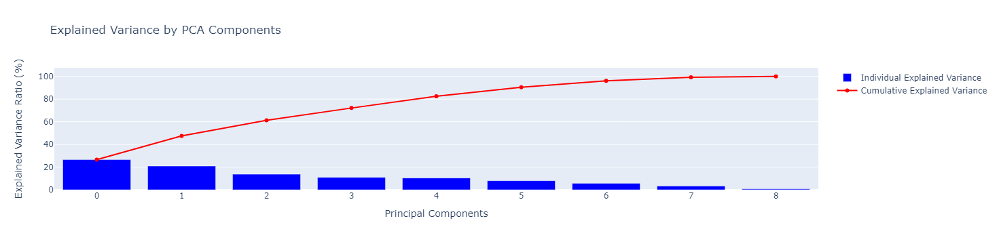

In [21]:
pca = PCA()
principal_components = pca.fit_transform(scaled_df[selected_cols])

# 설명된 분산 비율
explained_variance_ratio = pca.explained_variance_ratio_*100
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# 그래프 구성
trace1 = {
    "name": "Individual Explained Variance",
    "type": "bar",
    'y': explained_variance_ratio,
    'marker': {'color': 'blue'}
}
trace2 = {
    "name": "Cumulative Explained Variance",
    "type": "scatter",
    'y': cumulative_explained_variance,
    'marker': {'color': 'red'}
}

data = [trace1, trace2]

layout = {
    "xaxis": {"title": "Principal Components"},
    "yaxis": {"title": "Explained Variance Ratio (%)"},
    "title": "Explained Variance by PCA Components"
}

fig = go.Figure(data=data, layout=layout)
fig.show()

In [22]:
pca = PCA(n_components=6)

printcipalComponents = pca.fit_transform(scaled_df[selected_cols])

principalDf = pd.DataFrame(data=printcipalComponents, columns = ['PCA0', 'PCA1', 'PCA2', 'PCA3', 'PCA4', 'PCA5'])
principalDf = pd.concat([scaled_df['Cluster'], principalDf], axis=1)
Cluster_mapping = {0: 'VIP 고객', 1: '제로 리스크 고객', 2 : '일반 고객', 3: '고위험 고객', 4: '이탈 고객', 5: '주 타겟 고객'}
principalDf['Cluster'] = principalDf['Cluster'].replace(Cluster_mapping)

high_rc = ['이탈 고객', '주 타겟 고객']
principalDf['Interested_Cluster'] = principalDf['Cluster'].apply(lambda x: x if x in high_rc else '현존 고객')
pca.explained_variance_ratio_
principalDf.head()

,Cluster,PCA0,PCA1,PCA2,PCA3,PCA4,PCA5,Interested_Cluster
0,일반 고객,-1.047463,-1.442204,1.391270,0.465465,1.826895,1.155795,현존 고객
1,일반 고객,-1.296264,-1.217909,2.062232,1.090324,1.746446,1.716695,현존 고객
2,제로 리스크 고객,1.366725,1.067346,5.629028,3.037059,2.488999,2.839545,현존 고객
3,고위험 고객,-2.484421,3.653182,0.338707,2.666038,1.040501,1.152302,현존 고객
4,제로 리스크 고객,1.219641,0.348432,5.192422,2.557532,1.554374,2.713751,현존 고객


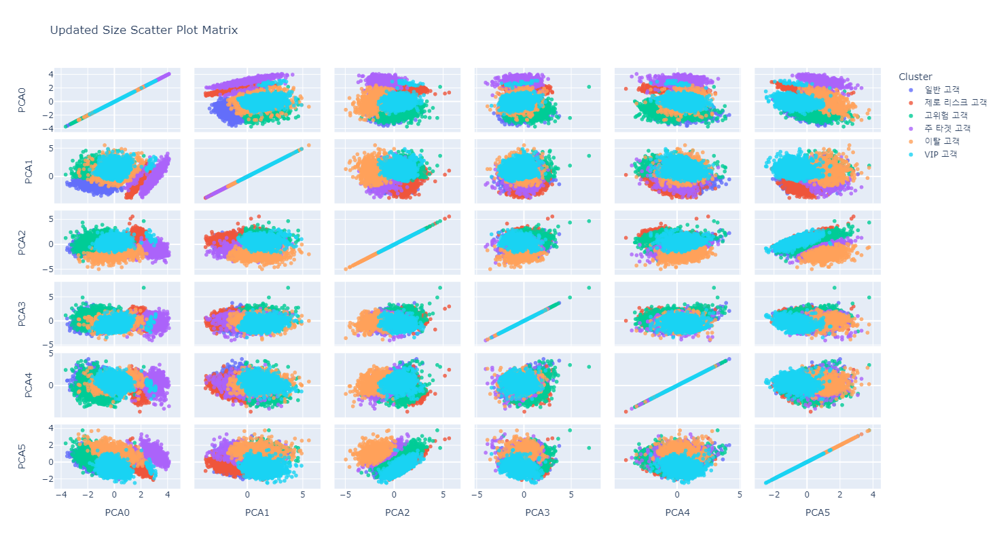

In [23]:
# 90% 이상 누적 설명력을 가진 주성분 수
n_components = np.where(cumulative_explained_variance >= 90)[0][0] + 1

# 데이터 프레임 업데이트: 원본 범주형 변수 제거
# df.drop(categorical_features, axis=1, inplace=True)

# 선택된 주성분만 추가
for i in range(n_components):
    df[f'PC{i+1}'] = principal_components[:, i]
    
    
# Attrition_Flag에 따른 주성분 분포 Scatter Plot
fig_scatter = px.scatter_matrix(
    principalDf,
    dimensions=[f'PCA{i}' for i in range(6)],
    color="Cluster",
    title="Scatter plot of Principal Components by Attrition Flag",
    color_continuous_scale='Cividis',
    opacity=0.8
)

fig_scatter.update_layout(
    width=1200,
    height=800,  
    title_text='Updated Size Scatter Plot Matrix'
)

fig_scatter.show()

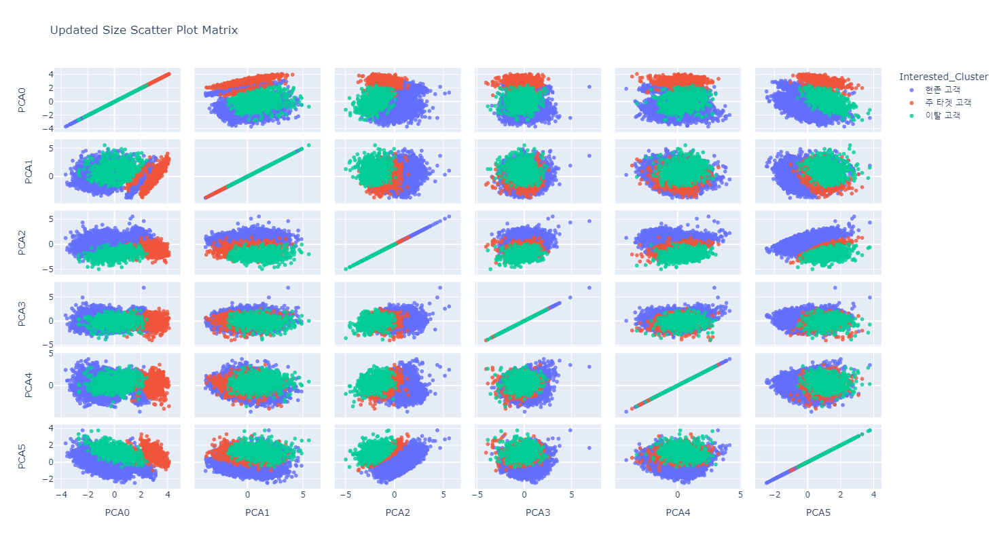

In [24]:
# 90% 이상 누적 설명력을 가진 주성분 수
n_components = np.where(cumulative_explained_variance >= 90)[0][0] + 1


# 선택된 주성분만 추가
for i in range(n_components):
    df[f'PC{i+1}'] = principal_components[:, i]
    
    
# Attrition_Flag에 따른 주성분 분포 Scatter Plot
fig_scatter = px.scatter_matrix(
    principalDf,
    dimensions=[f'PCA{i}' for i in range(6)],
    color="Interested_Cluster",
    title="Scatter plot of Principal Components by Attrition Flag",
    color_continuous_scale='Cividis',
    opacity=0.8
)

fig_scatter.update_layout(
    width=1200,
    height=800,  
    title_text='Updated Size Scatter Plot Matrix'
)

fig_scatter.show()